In [1]:

import drjit as dr
import mitsuba as mi

import plotly.graph_objects as go
import numpy as np
# import matplotlib.pyplot as plt
from matplotlib import pyplot as plt
import meshplot as mp

# import plotly.graph_objects as go


# mi.set_variant('llvm_ad_rgb')
mi.set_variant('cuda_ad_rgb')

from mitsuba import ScalarTransform4f as T

mi.__file__

'/home/lyao/Documents/GitHub/mitsuba3/build/python/mitsuba/__init__.py'

In [2]:

import sys
sys.path.append('../')

from optimizer import *
from vis_utils import *

mesh plot 

In [3]:
# vis_result_matrix(record_p_e_1,record_r_e_1,ref_R,ref_T,coef=0.03)

# Utils

In [4]:
def plot_errors(l1,l2,l3,file):
    fig, axs = plt.subplots(1, 3, figsize=(20, 5))

    axs[0].plot(l1)
    axs[0].set_xlabel('iteration'); 
    axs[0].set_ylabel('Loss'); 
    axs[0].set_title('Matrix error plot');

    axs[1].plot(l2)
    axs[1].set_xlabel('iteration'); 
    axs[1].set_ylabel('Loss'); 
    axs[1].set_title('Translation error plot');

    axs[2].plot(l3)
    axs[2].set_xlabel('iteration'); 
    axs[2].set_ylabel('Loss'); 
    axs[2].set_title('Rotation error plot');

    plt.savefig('./matrix/loss'+file+'.png')
    np.save('./matrix/'+file+'_l1.npy',l1)
    np.save('./matrix/'+file+'_l2.npy',l2)
    np.save('./matrix/'+file+'_l3.npy',l3)



In [5]:
def plot_rotation(record_p,record_r,file):
    dir_vec = mi.Point3f(0,0,1)
    directions = [ri @ dir_vec for ri in record_r]
    directions = np.array(directions).reshape(len(record_p),3)

    x = directions[:,0]
    y = directions[:,1]
    z = directions[:,2]

    origin = go.Scatter3d(
        x=[0],
        y=[0],
        z=[0],
        mode='markers',
        marker=dict(size=4, color='blue')
    )

    scatter = go.Scatter3d(
        x=x,
        y=y,
        z=z,
        mode='lines+markers',
        line=dict(color='blue', width=2),
        marker=dict(size=2, color='red')
    )

    lines = []
    lines.append(go.Scatter3d(
            x=[0, x[0]],
            y=[0, y[0]],
            z=[0, z[0]],
            mode='lines+markers',
            line=dict(color='red', width=1),
            marker=dict(size=2, color='red')
        ))
    for i in range(len(x)-1):
        if i == 0:
            continue
        line = go.Scatter3d(
            x=[0, x[i]],
            y=[0, y[i]],
            z=[0, z[i]],
            opacity=0.1,
            mode='lines+markers',
            line=dict(color='red', width=2),
            marker=dict(size=2, color='red')
        )
        lines.append(line)
    lines.append(go.Scatter3d(
            x=[0, x[len(x)-1]],
            y=[0, y[len(x)-1]],
            z=[0, z[len(x)-1]],
            mode='lines+markers',
            line=dict(color='blue', width=2),
            marker=dict(size=2, color='blue')
        ))
    lines.append(go.Scatter3d(
            x=[0, 0],
            y=[0, 0],
            z=[0, -1],
            mode='lines+markers',
            line=dict(color='black', width=2),
            marker=dict(size=2, color='black')
        ))

    layout = go.Layout(
        scene=dict(
            xaxis=dict(title='X', range=[-1.2, 1.2]),
            yaxis=dict(title='Y', range=[-1.2, 1.2]),
            zaxis=dict(title='Z', range=[-1.2, 1.2]),
            aspectmode='cube',
        ),
        margin=dict(l=0, r=0, b=0, t=0)
    )
    plotly_data = []
    theta = np.linspace(0,2*np.pi,50)
    phi = np.linspace(0,np.pi,50)
    r = 1
    x = r*np.outer(np.cos(theta),np.sin(phi))
    y = r*np.outer(np.sin(theta),np.sin(phi))
    z = r*np.outer(np.ones(50),np.cos(phi))
    sphere = go.Surface(
        x=x,
        y=y,
        z=z,
        opacity=0.1,
        hoverinfo='none', #also tried hoverinfo='none'
        showscale=False,
        colorscale=['blue','blue'])
    plotly_data.append(sphere)

    camera = dict(
        eye=dict(x=0.1, y=0.1, z=1.5)
    )

    fig = go.Figure(data=[origin] + lines + [scatter] + plotly_data, layout=layout)
    fig.update_layout(scene_camera=camera)
    fig. update_layout(showlegend=False)

    fig.show()
    fig.write_image("./matrix/"+file+"_1.png")

    camera = dict(
        eye=dict(x=1, y=1, z=0.5)
    )

    fig = go.Figure(data=[origin] + lines + [scatter] + plotly_data, layout=layout)
    fig.update_layout(scene_camera=camera)
    fig. update_layout(showlegend=False)

    fig.show()
    fig.write_image("./matrix/"+file+"_2.png")
    fig.write_html("./matrix/"+file+"_rotate.html")


In [6]:
def plot_transform(record_p,record_r,file):
    dir_vec = mi.Point3f(0,0,1)
    directions = [ri @ dir_vec for ri in record_r]
    directions = np.array(directions).reshape(len(record_p),3)

    pos = np.array(record_p)

    x = pos[:,0]
    y = pos[:,1]
    z = pos[:,2]

    coef = 0.1
    x2 = x + directions[:,0] * coef
    y2 = y + directions[:,1] * coef
    z2= z + directions[:,2] * coef

    # origin = go.Scatter3d(
    #     x=[0],
    #     y=[0],
    #     z=[0],
    #     mode='markers',
    #     marker=dict(size=4, color='blue')
    # )

    # draw positions
    scatter = go.Scatter3d(
        x=x,
        y=y,
        z=z,
        mode='lines+markers',
        line=dict(color='blue', width=2),
        marker=dict(size=2, color='red')
    )

    lines = []
    lines.append(go.Scatter3d(
            x=[x[0], x2[0]],
            y=[y[0], y2[0]],
            z=[z[0], z2[0]],
            mode='lines+markers',
            line=dict(color='red', width=1),
            marker=dict(size=2, color='red')
        ))
    for i in range(len(x)-1):
        if i == 0:
            continue
        line = go.Scatter3d(
            x=[x[i], x2[i]],
            y=[y[i], y2[i]],
            z=[z[i], z2[i]],
            opacity=0.2,
            mode='lines+markers',
            line=dict(color='red', width=1),
            marker=dict(size=2, color='red')
        )
        lines.append(line)
    lines.append(go.Scatter3d(
            x=[x[len(x)-1], x2[len(x)-1]],
            y=[y[len(x)-1], y2[len(x)-1]],
            z=[z[len(x)-1], z2[len(x)-1]],
            mode='lines+markers',
            line=dict(color='blue', width=2),
            marker=dict(size=2, color='blue')
        ))
    lines.append(go.Scatter3d(
            x=[0, 0],
            y=[0, 0],
            z=[2, 2-coef],
            mode='lines+markers',
            line=dict(color='black', width=2),
            marker=dict(size=2, color='black')
        ))

    layout = go.Layout(
        scene=dict(
            xaxis=dict(title='X', range=[-1, 1]),
            yaxis=dict(title='Y', range=[-1, 1]),
            zaxis=dict(title='Z', range=[0, 2.5]),
            aspectmode='cube',
        ),
        margin=dict(l=0, r=0, b=0, t=0)
    )
    # plotly_data = []
    # theta = np.linspace(0,2*np.pi,50)
    # phi = np.linspace(0,np.pi,50)
    # r = 1
    # x = r*np.outer(np.cos(theta),np.sin(phi))
    # y = r*np.outer(np.sin(theta),np.sin(phi))
    # z = r*np.outer(np.ones(50),np.cos(phi))
    # sphere = go.Surface(
    #     x=x,
    #     y=y,
    #     z=z,
    #     opacity=0.1,
    #     hoverinfo='none', #also tried hoverinfo='none'
    #     showscale=False,
    #     colorscale=['blue','blue'])
    # plotly_data.append(sphere)

    camera = dict(
        eye=dict(x=0.1, y=0.1, z=1.5)
    )

    fig = go.Figure(data=[scatter]+ lines, layout=layout)
    fig.update_layout(scene_camera=camera)
    fig. update_layout(showlegend=False)

    fig.show()
    fig.write_image("./matrix/"+file+"_3.png")

    camera = dict(
        eye=dict(x=1, y=1, z=0.5)
    )

    fig = go.Figure(data=lines + [scatter], layout=layout)
    fig.update_layout(scene_camera=camera)
    fig. update_layout(showlegend=False)

    fig.show()
    fig.write_image("./matrix/"+file+"_4.png")
    fig.write_html("./matrix/"+file+"_trans.html")


# Parameters

In [7]:
init  = T.look_at(
                        origin=(0, 0, 2),
                        target=(0, 0, 0),
                        up=(0, 1, 0)
                    )

In [8]:
# euler angle parameters
Rotate = mi.Point3f(-0.2,0.6,0.9)
Trans = mi.Point3f(0.6,0.3,0.9)

# transform to SO3
trafo = mi.Transform4f.translate(Trans).rotate([1, 0, 0], Rotate.x * 180).rotate([0, 1, 0], Rotate.y * 180.0).rotate([0, 0, 1], Rotate.z * 180.0)
opt_init_state = trafo
ref_R = mi.Matrix3f(init.matrix)
ref_T = init.translation()
ref_mat = init

In [15]:
it_times = 100

# 0. se3

In [16]:
def run_optimization(opt,iteration_count=it_times):

    loss_hist = []
    loss_hist_t = []
    loss_hist_r = []
    record_r = []
    record_p = []
    for it in range(iteration_count):
        # record.append(np.array([opt['a'][0],opt['a'][1],opt['a'][2]]))
        
        # Evaluate the objective function
        mat = se3_to_SE3(opt['w'],opt['u'])

        with dr.suspend_grad():
            record_r.append(mi.Matrix3f(mat.matrix))
            record_p.append([mat.translation().x[0],mat.translation().y[0],mat.translation().z[0]])
            loss_hist_t.append(dr.sum(dr.sqr(mat.translation() - ref_mat.translation())))
            loss_hist_r.append(dr.sum(dr.sum(dr.unravel(mi.Matrix3f, dr.sqr(dr.ravel(mi.Matrix3f(mat.matrix - ref_mat.matrix)))))))
        # loss = dr.sum(dr.sqr(opt['a']-b))
        loss = dr.sum(dr.sum(dr.unravel(mi.Matrix4f, dr.sqr(dr.ravel(mat.matrix - ref_mat.matrix)))))

        # Backpropagate through the rendering process
        dr.backward(loss)

        # Optimizer: take a gradient descent step
        opt.step()

        loss_hist.append(loss)
        print(f"Iteration {it:02d}: error={loss[0]:6f}", end='\r')
    return loss_hist, loss_hist_t, loss_hist_r, record_r, record_p

## Original Adam

In [17]:
opt = R_Adam(lr=0.05,mode = 0)
wu = SE3_to_se3(opt_init_state.matrix)
opt['w'] = mi.Point3f(wu[0],wu[1],wu[2])
opt['u'] = mi.Point3f(wu[3],wu[4],wu[5])

In [18]:
loss_hist, loss_hist_t, loss_hist_r, record_r, record_p = run_optimization(opt,it_times)

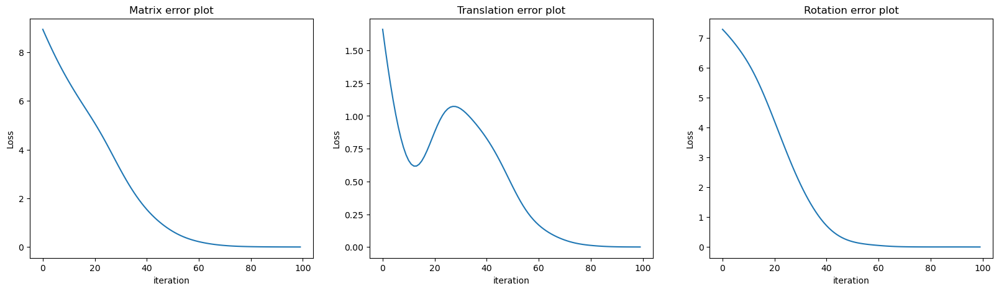

In [19]:
file = "se0"
plot_errors(loss_hist, loss_hist_t, loss_hist_r,file)

In [20]:
plot_rotation(record_p,record_r,file)
plot_transform(record_p,record_r,file)

## Unifrom Adam

In [21]:
opt = R_Adam(lr=0.05,mode = 1)
wu = SE3_to_se3(opt_init_state.matrix)
opt['w'] = mi.Point3f(wu[0],wu[1],wu[2])
opt['u'] = mi.Point3f(wu[3],wu[4],wu[5])

In [22]:
loss_hist, loss_hist_t, loss_hist_r, record_r, record_p = run_optimization(opt,it_times)

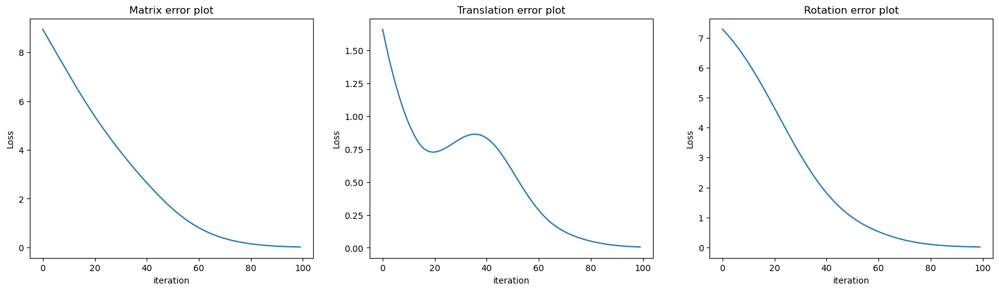

In [23]:
file = "se1"
plot_errors(loss_hist, loss_hist_t, loss_hist_r,file)

In [24]:
plot_rotation(record_p,record_r,file)
plot_transform(record_p,record_r,file)

## Vector Adam

In [25]:
opt = R_Adam(lr=0.05,mode = 2)
wu = SE3_to_se3(opt_init_state.matrix)
opt['w'] = mi.Point3f(wu[0],wu[1],wu[2])
opt['u'] = mi.Point3f(wu[3],wu[4],wu[5])

In [26]:
loss_hist, loss_hist_t, loss_hist_r, record_r, record_p = run_optimization(opt,it_times)

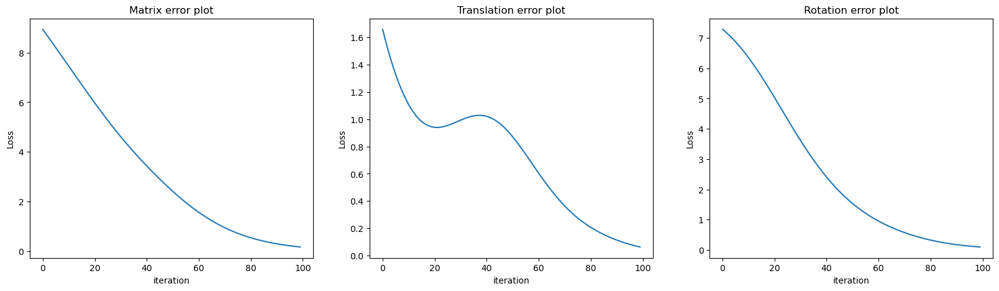

In [27]:
file = "se2"
plot_errors(loss_hist, loss_hist_t, loss_hist_r,file)

In [28]:
plot_rotation(record_p,record_r,file)
plot_transform(record_p,record_r,file)

# 1. Euler angles

In [29]:
def run_optimization(opt,iteration_count=it_times):

    loss_hist = []
    loss_hist_t = []
    loss_hist_r = []
    record_r = []
    record_p = []
    for it in range(iteration_count):
        # record.append(np.array([opt['a'][0],opt['a'][1],opt['a'][2]]))
        
        # Evaluate the objective function
        mat = mi.Transform4f.translate(opt['Trans']).rotate([1, 0, 0], opt['Rotate'].x * 180).rotate([0, 1, 0], opt['Rotate'].y * 180.0).rotate([0, 0, 1], opt['Rotate'].z * 180.0)

        record_r.append(mi.Matrix3f(mat.matrix))
        record_p.append([opt['Trans'].x[0],opt['Trans'].y[0],opt['Trans'].z[0]])
        with dr.suspend_grad():
            loss_hist_t.append(dr.sum(dr.sqr(mat.translation() - ref_mat.translation())))
            loss_hist_r.append(dr.sum(dr.sum(dr.unravel(mi.Matrix3f, dr.sqr(dr.ravel(mi.Matrix3f(mat.matrix - ref_mat.matrix)))))))
        # loss = dr.sum(dr.sqr(opt['a']-b))
        loss = dr.sum(dr.sum(dr.unravel(mi.Matrix4f, dr.sqr(dr.ravel(mat.matrix - ref_mat.matrix)))))

        # Backpropagate through the rendering process
        dr.backward(loss)

        # Optimizer: take a gradient descent step
        opt.step()

        loss_hist.append(loss)
        print(f"Iteration {it:02d}: error={loss[0]:6f}", end='\r')
    return loss_hist, loss_hist_t, loss_hist_r, record_r, record_p

## Original Adam

In [30]:
opt = R_Adam(lr=0.05,mode = 0)
opt['Rotate'] = mi.Point3f(-0.2,0.6,0.9)
opt['Trans'] = mi.Point3f(0.6,0.3,0.9)


In [31]:
loss_hist, loss_hist_t, loss_hist_r, record_r, record_p = run_optimization(opt,it_times)

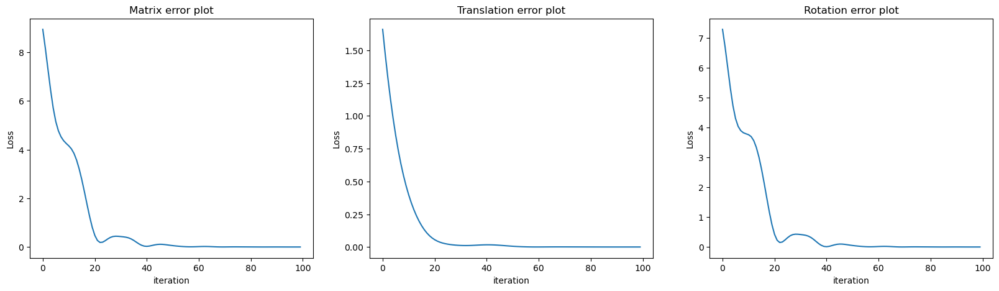

In [32]:
file = "euler0"
plot_errors(loss_hist, loss_hist_t, loss_hist_r,file)

In [33]:
plot_rotation(record_p,record_r,file)
plot_transform(record_p,record_r,file)

## Uniform Adam

In [34]:
opt = R_Adam(lr=0.05,mode = 1)
opt['Rotate'] = mi.Point3f(-0.2,0.6,0.9)
opt['Trans'] = mi.Point3f(0.6,0.3,0.9)


In [35]:
loss_hist, loss_hist_t, loss_hist_r, record_r, record_p = run_optimization(opt,it_times)

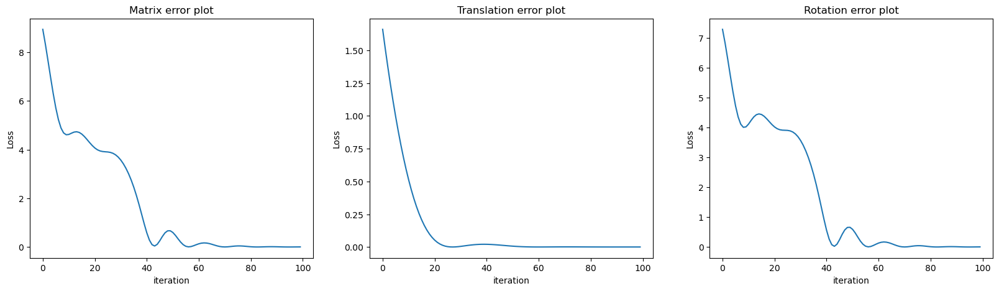

In [36]:
file = "euler1"
plot_errors(loss_hist, loss_hist_t, loss_hist_r,file)

In [37]:
plot_rotation(record_p,record_r,file)
plot_transform(record_p,record_r,file)

## Vector Adam

In [38]:
opt = R_Adam(lr=0.05,mode = 2)
opt['Rotate'] = mi.Point3f(-0.2,0.6,0.9)
opt['Trans'] = mi.Point3f(0.6,0.3,0.9)


In [39]:
loss_hist, loss_hist_t, loss_hist_r, record_r, record_p = run_optimization(opt,it_times)

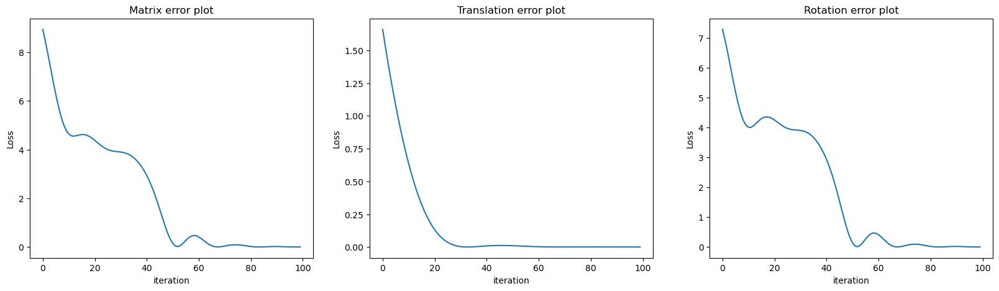

In [40]:
file = "euler2"
plot_errors(loss_hist, loss_hist_t, loss_hist_r,file)

In [41]:
plot_rotation(record_p,record_r,file)
plot_transform(record_p,record_r,file)

# 2. Vector space

In [42]:
def run_optimization(opt,iteration_count=it_times):

    loss_hist = []
    loss_hist_t = []
    loss_hist_r = []
    record_r = []
    record_p = []
    for it in range(iteration_count):

        # Evaluate the objective function
        mat = mi.Transform4f.translate(opt['Trans']) @ mi.Matrix4f(so3_to_SO3(w_to_wx(opt['Rotate'])))

        record_r.append(so3_to_SO3(w_to_wx(opt['Rotate'])))
        record_p.append([opt['Trans'].x[0],opt['Trans'].y[0],opt['Trans'].z[0]])
        
        with dr.suspend_grad():
            loss_hist_t.append(dr.sum(dr.sqr(mat.translation() - ref_mat.translation())))
            loss_hist_r.append(dr.sum(dr.sum(dr.unravel(mi.Matrix3f, dr.sqr(dr.ravel(mi.Matrix3f(mat.matrix - ref_mat.matrix)))))))

        loss = dr.sum(dr.sum(dr.unravel(mi.Matrix4f, dr.sqr(dr.ravel(mat.matrix - ref_mat.matrix)))))

        # Backpropagate through the rendering process
        dr.backward(loss)

        # Optimizer: take a gradient descent step
        opt.step()

        loss_hist.append(loss)
        print(f"Iteration {it:02d}: error={loss[0]:6f}", end='\r')
    return loss_hist, loss_hist_t, loss_hist_r, record_r, record_p

## Original Adam

In [43]:
opt = R_Adam(lr=0.05,mode=0)
opt['Rotate'] = SO3_to_so3(mi.Matrix3f(opt_init_state.matrix))
opt['Trans'] = opt_init_state.translation()

In [44]:
loss_hist, loss_hist_t, loss_hist_r, record_r, record_p = run_optimization(opt,it_times)

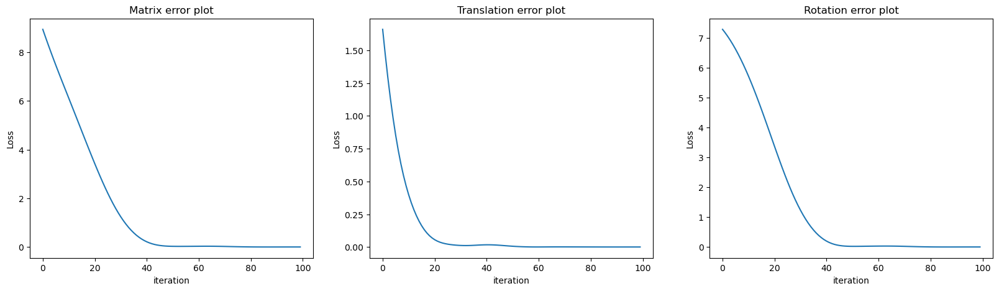

In [45]:
file = "vector0"
plot_errors(loss_hist, loss_hist_t, loss_hist_r,file)

In [46]:
plot_rotation(record_p,record_r,file)
plot_transform(record_p,record_r,file)

## Uniform Adam

In [47]:
opt = R_Adam(lr=0.05,mode=1)
opt['Rotate'] = SO3_to_so3(mi.Matrix3f(opt_init_state.matrix))
opt['Trans'] = opt_init_state.translation()

In [48]:
loss_hist, loss_hist_t, loss_hist_r, record_r, record_p = run_optimization(opt,it_times)

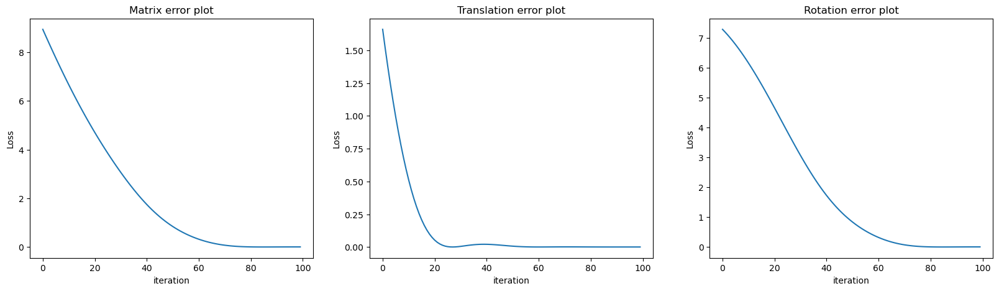

In [49]:
file = "vector1"
plot_errors(loss_hist, loss_hist_t, loss_hist_r,file)

In [50]:
plot_rotation(record_p,record_r,file)
plot_transform(record_p,record_r,file)

## Vector Adam

In [51]:
opt = R_Adam(lr=0.05,mode=2)
opt['Rotate'] = SO3_to_so3(mi.Matrix3f(opt_init_state.matrix))
opt['Trans'] = opt_init_state.translation()

In [52]:
loss_hist, loss_hist_t, loss_hist_r, record_r, record_p = run_optimization(opt,it_times)

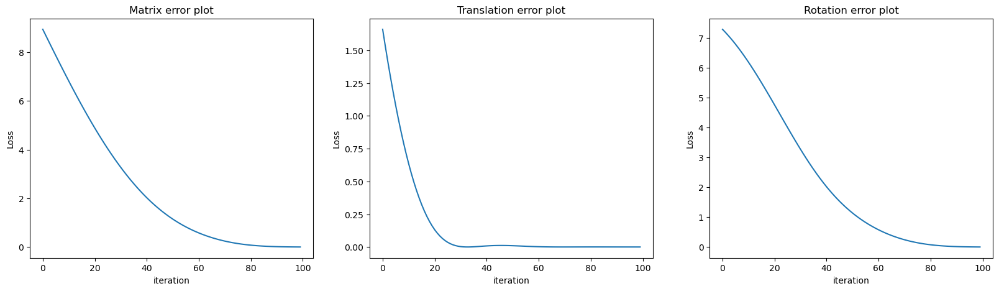

In [53]:
file = "vector2"
plot_errors(loss_hist, loss_hist_t, loss_hist_r,file)

In [54]:
plot_rotation(record_p,record_r,file)
plot_transform(record_p,record_r,file)

# 3. SO3 Matrix

In [55]:
def run_optimization(opt,iteration_count=it_times):

    loss_hist = []
    loss_hist_t = []
    loss_hist_r = []
    record_r = []
    record_p = []
    for it in range(iteration_count):

        # Evaluate the objective function
        mat = mi.Transform4f.translate(opt['Trans']) @ mi.Matrix4f(opt['R'])

        record_r.append(opt['R'])
        record_p.append([opt['Trans'].x[0],opt['Trans'].y[0],opt['Trans'].z[0]])
        with dr.suspend_grad():
            loss_hist_t.append(dr.sum(dr.sqr(mat.translation() - ref_mat.translation())))
            loss_hist_r.append(dr.sum(dr.sum(dr.unravel(mi.Matrix3f, dr.sqr(dr.ravel(mi.Matrix3f(mat.matrix - ref_mat.matrix)))))))

        loss = dr.sum(dr.sum(dr.unravel(mi.Matrix4f, dr.sqr(dr.ravel(mat.matrix - ref_mat.matrix)))))

        # Backpropagate through the rendering process
        dr.backward(loss)

        # Optimizer: take a gradient descent step
        opt.step()

        loss_hist.append(loss)
        print(f"Iteration {it:02d}: error={loss[0]:6f}", end='\r')
    return loss_hist, loss_hist_t, loss_hist_r, record_r, record_p

## Original Adam

In [56]:
opt = R_Adam(lr=0.05, mode=0)
opt['R'] = mi.Matrix3f(opt_init_state.matrix)
opt['Trans'] = opt_init_state.translation()

In [57]:
loss_hist, loss_hist_t, loss_hist_r, record_r, record_p = run_optimization(opt,it_times)

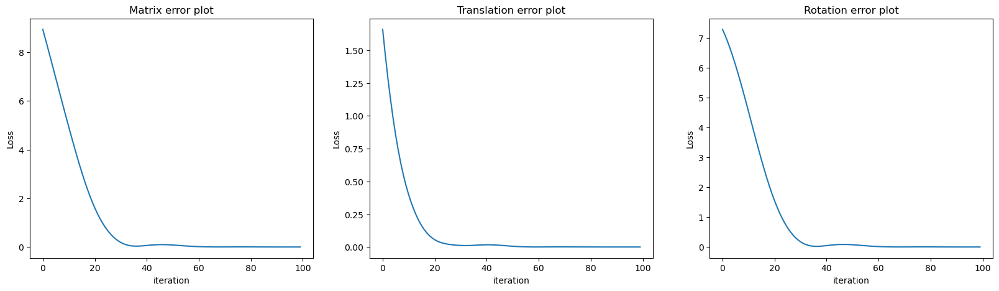

In [58]:
file = "matrix0"
plot_errors(loss_hist, loss_hist_t, loss_hist_r,file)

In [59]:
plot_rotation(record_p,record_r,file)
plot_transform(record_p,record_r,file)

## Uniform Adam

In [60]:
opt = R_Adam(lr=0.05, mode=1)
opt['R'] = mi.Matrix3f(opt_init_state.matrix)
opt['Trans'] = opt_init_state.translation()

In [61]:
loss_hist, loss_hist_t, loss_hist_r, record_r, record_p = run_optimization(opt,it_times)

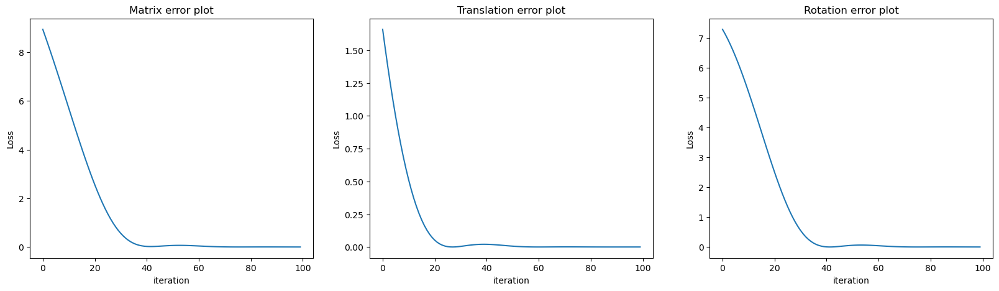

In [62]:
file = "matrix1"
plot_errors(loss_hist, loss_hist_t, loss_hist_r,file)

In [63]:
plot_rotation(record_p,record_r,file)
plot_transform(record_p,record_r,file)

## Vector Adam

In [64]:
opt = R_Adam(lr=0.05, mode=2)
opt['R'] = mi.Matrix3f(opt_init_state.matrix)
opt['Trans'] = opt_init_state.translation()

In [65]:
loss_hist, loss_hist_t, loss_hist_r, record_r, record_p = run_optimization(opt,it_times)

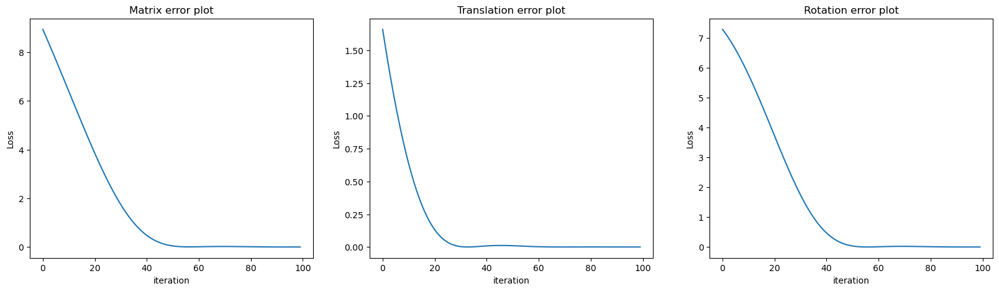

In [66]:
file = "matrix2"
plot_errors(loss_hist, loss_hist_t, loss_hist_r,file)

In [67]:
plot_rotation(record_p,record_r,file)
plot_transform(record_p,record_r,file)

# 4. Quaternion

In [68]:
def q_to_R(q):
    R = mi.Matrix3f(1-2*(q.z**2+q.w**2),2*(q.y*q.z-q.x*q.w),2*(q.y*q.w+q.z*q.x),
                    2*(q.y*q.z+q.w*q.x),1-2*(q.y**2+q.w**2),2*(q.z*q.w-q.y*q.x),
                    2*(q.y*q.w-q.z*q.x),2*(q.z*q.w+q.y*q.x),1-2*(q.y**2+q.z**2))
    return R


In [69]:
def w_to_q(w):
    theta_2 = dr.norm(w) / 2
    a = w/dr.norm(w)
    r = dr.cos(theta_2)
    i = dr.sin(theta_2) * a
    q = mi.Point4f(r,i.x,i.y,i.z)
    return q

In [70]:
def run_optimization(opt,iteration_count=it_times):

    loss_hist = []
    loss_hist_t = []
    loss_hist_r = []
    record_r = []
    record_p = []
    for it in range(iteration_count):

        opt['q']  = dr.normalize(opt['q'])

        # mat = mi.Transform4f.translate(opt['Trans']) @ mi.Matrix4f(q_to_R(opt['q']))
        mat = mi.Transform4f.translate(opt['Trans']) @ dr.quat_to_matrix(mi.Quaternion4f(opt['q']))

        record_r.append(mi.Matrix3f(dr.quat_to_matrix(mi.Quaternion4f(opt['q']))))
        record_p.append([opt['Trans'].x[0],opt['Trans'].y[0],opt['Trans'].z[0]])
        with dr.suspend_grad():
            loss_hist_t.append(dr.sum(dr.sqr(mat.translation() - ref_mat.translation())))
            loss_hist_r.append(dr.sum(dr.sum(dr.unravel(mi.Matrix3f, dr.sqr(dr.ravel(mi.Matrix3f(mat.matrix - ref_mat.matrix)))))))

        loss = dr.sum(dr.sum(dr.unravel(mi.Matrix4f, dr.sqr(dr.ravel(mat.matrix - ref_mat.matrix)))))

        # Backpropagate through the rendering process
        dr.backward(loss)

        # Optimizer: take a gradient descent step
        opt.step()

        loss_hist.append(loss)
        print(f"Iteration {it:02d}: error={loss[0]:6f},q={opt['q']}", end='\r')

    return loss_hist, loss_hist_t, loss_hist_r, record_r, record_p

## Original Adam

In [71]:
mi.Vector4f(dr.matrix_to_quat(mi.Matrix3f(opt_init_state.matrix)))

[[0.7315340042114258, 0.29976338148117065, 0.5130259394645691, 0.3343716561794281]]

In [72]:
opt = mi.ad.Adam(lr=0.05)
# opt['q'] = w_to_q(SO3_to_so3(mi.Matrix3f(opt_init_state.matrix)))
opt['q'] = mi.Vector4f(dr.matrix_to_quat(mi.Matrix3f(opt_init_state.matrix)))
opt['Trans'] = opt_init_state.translation()

In [73]:
loss_hist, loss_hist_t, loss_hist_r, record_r, record_p = run_optimization(opt,it_times)

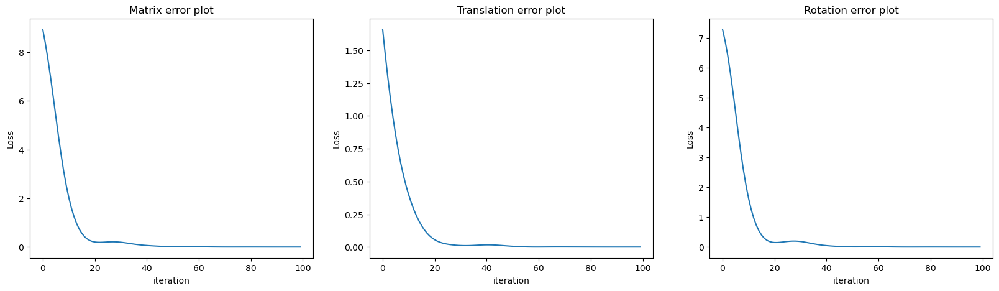

In [74]:
file = "quat0"
plot_errors(loss_hist, loss_hist_t, loss_hist_r,file)

In [75]:
plot_rotation(record_p,record_r,file)
plot_transform(record_p,record_r,file)

## Uniform Adam

In [76]:
opt = R_Adam(lr=0.05, mode = 1)
# opt['q'] = w_to_q(SO3_to_so3(mi.Matrix3f(opt_init_state.matrix)))
opt['q'] = mi.Vector4f(dr.matrix_to_quat(mi.Matrix3f(opt_init_state.matrix)))
opt['Trans'] = opt_init_state.translation()

In [77]:
loss_hist, loss_hist_t, loss_hist_r, record_r, record_p = run_optimization(opt,it_times)

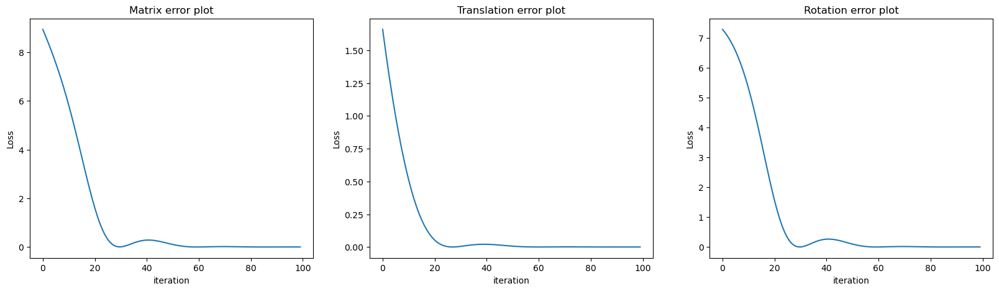

In [78]:
file = "quat1"
plot_errors(loss_hist, loss_hist_t, loss_hist_r,file)

In [79]:
plot_rotation(record_p,record_r,file)
plot_transform(record_p,record_r,file)

## Vector Adam

In [80]:
opt = R_Adam(lr=0.05, mode = 2)
# opt['q'] = w_to_q(SO3_to_so3(mi.Matrix3f(opt_init_state.matrix)))
opt['q'] = mi.Vector4f(dr.matrix_to_quat(mi.Matrix3f(opt_init_state.matrix)))
opt['Trans'] = opt_init_state.translation()

In [81]:
loss_hist, loss_hist_t, loss_hist_r, record_r, record_p = run_optimization(opt,it_times)

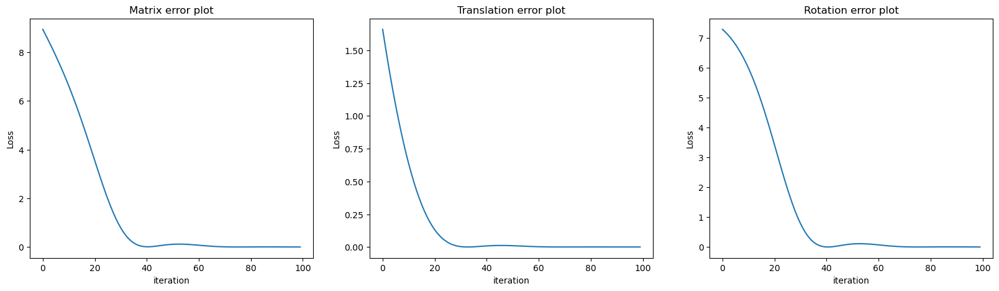

In [82]:
file = "quat2"
plot_errors(loss_hist, loss_hist_t, loss_hist_r,file)

In [83]:
plot_rotation(record_p,record_r,file)
plot_transform(record_p,record_r,file)

# 4. Quaternion2

In [84]:
def q_to_R(q):
    R = mi.Matrix3f(1-2*(q.z**2+q.w**2),2*(q.y*q.z-q.x*q.w),2*(q.y*q.w+q.z*q.x),
                    2*(q.y*q.z+q.w*q.x),1-2*(q.y**2+q.w**2),2*(q.z*q.w-q.y*q.x),
                    2*(q.y*q.w-q.z*q.x),2*(q.z*q.w+q.y*q.x),1-2*(q.y**2+q.z**2))
    return R


In [85]:
def w_to_q(w):
    theta_2 = dr.norm(w) / 2
    a = w/dr.norm(w)
    r = dr.cos(theta_2)
    i = dr.sin(theta_2) * a
    q = mi.Point4f(r,i.x,i.y,i.z)
    return q

In [86]:
def run_optimization(opt,iteration_count=it_times):

    loss_hist = []
    loss_hist_t = []
    loss_hist_r = []
    record_r = []
    record_p = []
    for it in range(iteration_count):

        # mat = mi.Transform4f.translate(opt['Trans']) @ mi.Matrix4f(q_to_R(opt['q']))
        mat = mi.Transform4f.translate(opt['Trans']) @ dr.quat_to_matrix(mi.Quaternion4f(opt['q']))

        record_r.append(mi.Matrix3f(dr.quat_to_matrix(mi.Quaternion4f(opt['q']))))
        record_p.append([opt['Trans'].x[0],opt['Trans'].y[0],opt['Trans'].z[0]])
        with dr.suspend_grad():
            loss_hist_t.append(dr.sum(dr.sqr(mat.translation() - ref_mat.translation())))
            loss_hist_r.append(dr.sum(dr.sum(dr.unravel(mi.Matrix3f, dr.sqr(dr.ravel(mi.Matrix3f(mat.matrix - ref_mat.matrix)))))))

        loss = dr.sum(dr.sum(dr.unravel(mi.Matrix4f, dr.sqr(dr.ravel(mat.matrix - ref_mat.matrix)))))

        # Backpropagate through the rendering process
        dr.backward(loss)

        # Optimizer: take a gradient descent step
        opt.step()

        loss_hist.append(loss)
        print(f"Iteration {it:02d}: error={loss[0]:6f},q={opt['q']}", end='\r')

    return loss_hist, loss_hist_t, loss_hist_r, record_r, record_p

## Original Adam

In [87]:
opt = Q_Adam(lr=0.05, mode = 0)
# opt['q'] = w_to_q(SO3_to_so3(mi.Matrix3f(opt_init_state.matrix)))
opt['q'] = mi.Vector4f(dr.matrix_to_quat(mi.Matrix3f(opt_init_state.matrix)))
opt['Trans'] = opt_init_state.translation()

In [88]:
loss_hist, loss_hist_t, loss_hist_r, record_r, record_p = run_optimization(opt,it_times)

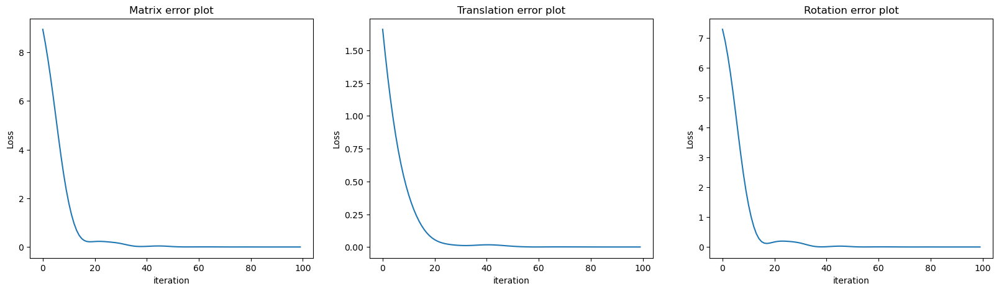

In [89]:
file = "2quat0"
plot_errors(loss_hist, loss_hist_t, loss_hist_r,file)

In [90]:
plot_rotation(record_p,record_r,file)
plot_transform(record_p,record_r,file)

## Uniform Adam

In [91]:
opt = Q_Adam(lr=0.05, mode = 1)
# opt['q'] = w_to_q(SO3_to_so3(mi.Matrix3f(opt_init_state.matrix)))
opt['q'] = mi.Vector4f(dr.matrix_to_quat(mi.Matrix3f(opt_init_state.matrix)))
opt['Trans'] = opt_init_state.translation()

In [92]:
loss_hist, loss_hist_t, loss_hist_r, record_r, record_p = run_optimization(opt,it_times)

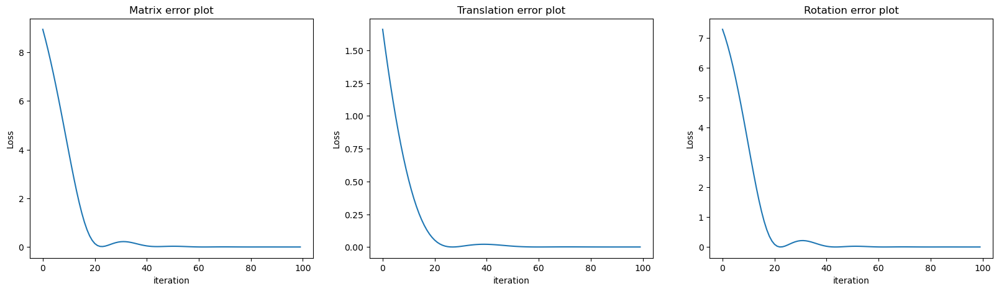

In [93]:
file = "2quat1"
plot_errors(loss_hist, loss_hist_t, loss_hist_r,file)

In [94]:
plot_rotation(record_p,record_r,file)
plot_transform(record_p,record_r,file)

## Vector Adam

In [95]:
opt = Q_Adam(lr=0.05, mode = 2)
# opt['q'] = w_to_q(SO3_to_so3(mi.Matrix3f(opt_init_state.matrix)))
opt['q'] = mi.Vector4f(dr.matrix_to_quat(mi.Matrix3f(opt_init_state.matrix)))
opt['Trans'] = opt_init_state.translation()

In [96]:
loss_hist, loss_hist_t, loss_hist_r, record_r, record_p = run_optimization(opt,it_times)

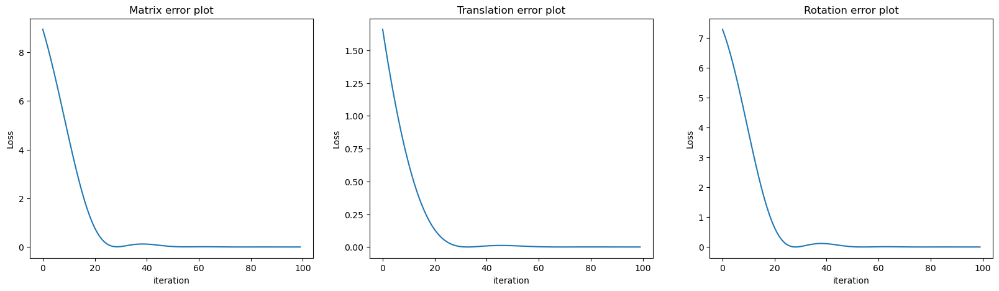

In [97]:
file = "2quat2"
plot_errors(loss_hist, loss_hist_t, loss_hist_r,file)

In [98]:
plot_rotation(record_p,record_r,file)
plot_transform(record_p,record_r,file)

# Plot Comparison

In [99]:
legends = ['se(3)','Euler Angle','so(3)','SO(3) Matrix','Unit Quaternion 1','Unit Quaternion 2']

In [102]:
name_idx = 0
title_names = ['','Uniform','Vector']

In [109]:
folder = './matrix/'
name = ['se','euler','vector','matrix','quat','2quat']
loss = '_l1.npy'
hist = []
for i in range(6):
    hist.append(np.load(folder+name[i]+str(name_idx)+loss))


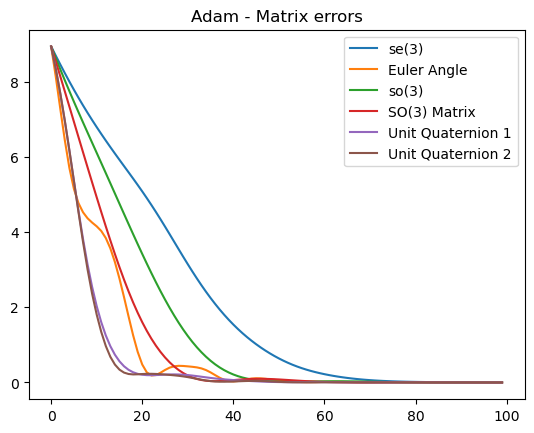

In [110]:
for i in range(6):
    plt.plot(hist[i])

plt.legend(legends)
plt.title(title_names[name_idx] +'Adam - Matrix errors')
plt.savefig(folder+title_names[name_idx]+'_Adam_matrix.png')

In [124]:
folder = './matrix/'
name = ['se','euler','vector','matrix','quat','2quat']
loss = '_l2.npy'
hist = []
for i in range(6):
    hist.append(np.load(folder+name[i]+str(name_idx)+loss))


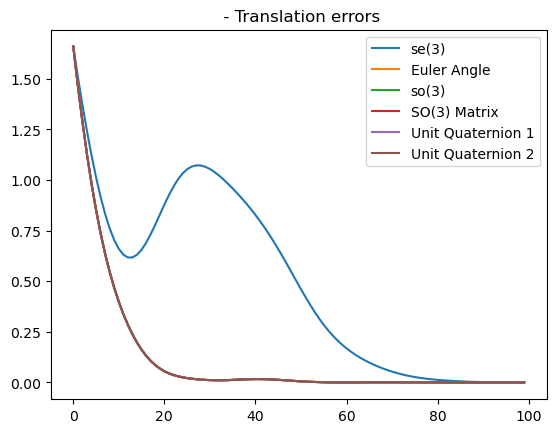

In [135]:
for i in range(6):
    plt.plot(hist[i])

plt.legend(legends)
plt.title(title_names[name_idx] +' - Translation errors')
plt.savefig(folder+title_names[name_idx]+'_Adam_trans.png')

In [118]:
folder = './matrix/'
name = ['se','euler','vector','matrix','quat','2quat']
loss = '_l3.npy'
hist = []
for i in range(6):
    hist.append(np.load(folder+name[i]+str(name_idx)+loss))


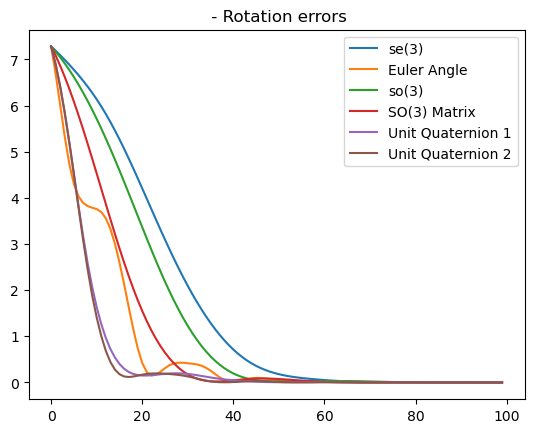

In [119]:
for i in range(6):
    plt.plot(hist[i])

plt.legend(legends)
plt.title(title_names[name_idx] +' - Rotation errors')
plt.savefig(folder+title_names[name_idx]+'_Adam_rot.png')

In [147]:
name_idx = 1
title_names = ['','Uniform','Vector']

In [148]:
folder = './matrix/'
name = ['se','euler','vector','matrix','quat','2quat']
loss = '_l1.npy'
hist = []
for i in range(6):
    hist.append(np.load(folder+name[i]+str(name_idx)+loss))


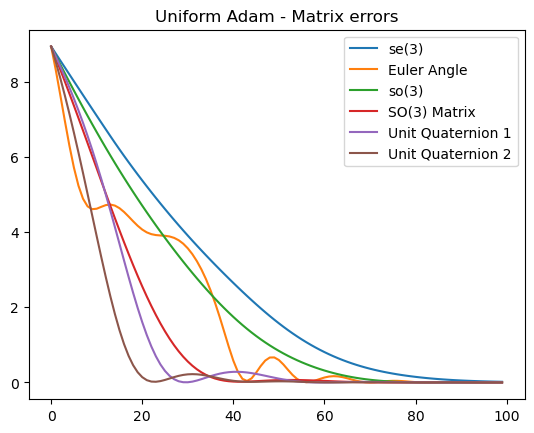

In [149]:
for i in range(6):
    plt.plot(hist[i])

plt.legend(legends)
plt.title(title_names[name_idx] +' Adam - Matrix errors')
plt.savefig(folder+title_names[name_idx]+'_Adam_matrix.png')

In [150]:
folder = './matrix/'
name = ['se','euler','vector','matrix','quat','2quat']
loss = '_l2.npy'
hist = []
for i in range(6):
    hist.append(np.load(folder+name[i]+str(name_idx)+loss))


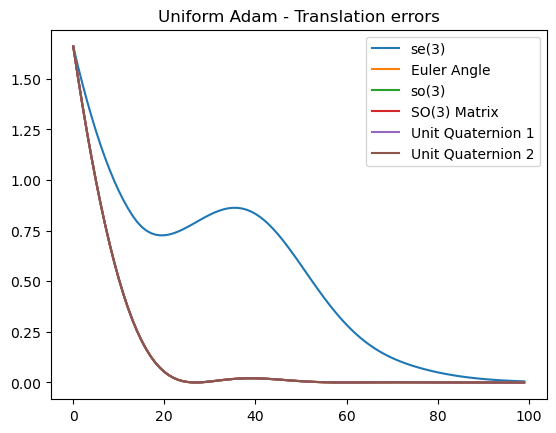

In [151]:
for i in range(6):
    plt.plot(hist[i])

plt.legend(legends)
plt.title(title_names[name_idx] +' Adam - Translation errors')
plt.savefig(folder+title_names[name_idx]+'_Adam_trans.png')

In [152]:
folder = './matrix/'
name = ['se','euler','vector','matrix','quat','2quat']
loss = '_l3.npy'
hist = []
for i in range(6):
    hist.append(np.load(folder+name[i]+str(name_idx)+loss))


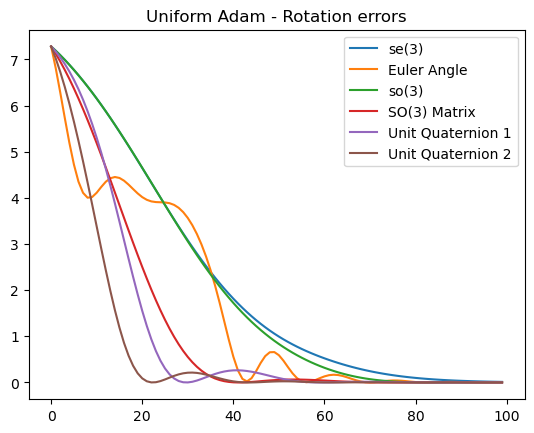

In [153]:
for i in range(6):
    plt.plot(hist[i])

plt.legend(legends)
plt.title(title_names[name_idx] +' Adam - Rotation errors')
plt.savefig(folder+title_names[name_idx]+'_Adam_rot.png')

In [156]:
name_idx = 2
title_names = ['','Uniform','Vector']

In [157]:
folder = './matrix/'
name = ['se','euler','vector','matrix','quat','2quat']
loss = '_l1.npy'
hist = []
for i in range(6):
    hist.append(np.load(folder+name[i]+str(name_idx)+loss))


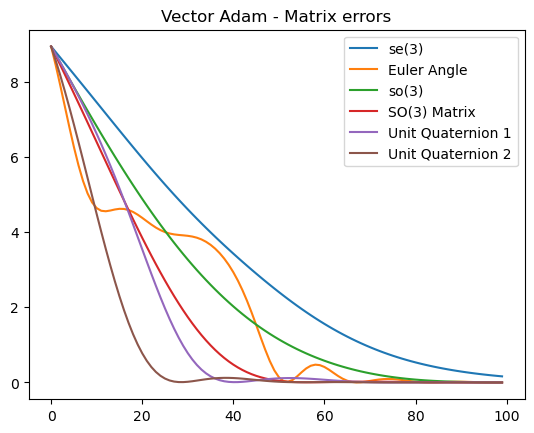

In [158]:
for i in range(6):
    plt.plot(hist[i])

plt.legend(legends)
plt.title(title_names[name_idx] +' Adam - Matrix errors')
plt.savefig(folder+title_names[name_idx]+'_Adam_matrix.png')

In [159]:
folder = './matrix/'
name = ['se','euler','vector','matrix','quat','2quat']
loss = '_l2.npy'
hist = []
for i in range(6):
    hist.append(np.load(folder+name[i]+str(name_idx)+loss))


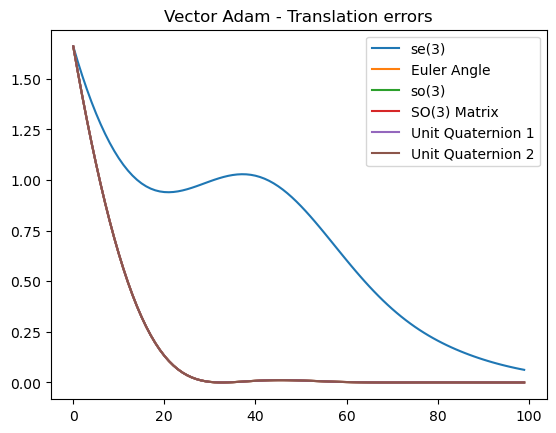

In [160]:
for i in range(6):
    plt.plot(hist[i])

plt.legend(legends)
plt.title(title_names[name_idx] +' Adam - Translation errors')
plt.savefig(folder+title_names[name_idx]+'_Adam_trans.png')

In [161]:
folder = './matrix/'
name = ['se','euler','vector','matrix','quat','2quat']
loss = '_l3.npy'
hist = []
for i in range(6):
    hist.append(np.load(folder+name[i]+str(name_idx)+loss))


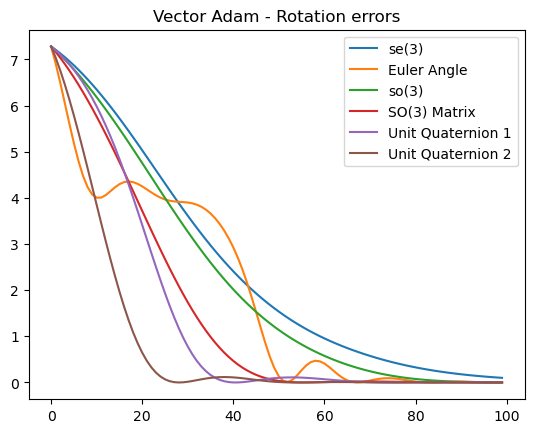

In [162]:
for i in range(6):
    plt.plot(hist[i])

plt.legend(legends)
plt.title(title_names[name_idx] +' Adam - Rotation errors')
plt.savefig(folder+title_names[name_idx]+'_Adam_rot.png')